In [2]:
import json
import os
from pycocotools import mask as mask_utils
from segment_anything.utils.amg import rle_to_mask
import matplotlib.pyplot as plt
from tqdm import tqdm 
from termcolor import colored 
import argparse 
prediction_dir = '/viscam/projects/ikea_video/cnos/output_0530_s1_c1'
prediction_dir_sam6d = '/viscam/projects/ikea_video/SAM-6D/SAM-6D/Instance_Segmentation_Model/sam6d_results'
data_path = '/viscam/projects/ikea_video/ikea-video/Extend-IKEA-Manual-Annotation-Interface/data/combined_data_0522_with_reannotated_pose.json'

def iou(mask1, mask2): 
    mask1 = mask1.astype(bool)
    mask2 = mask2.astype(bool)
    intersection = mask1 & mask2
    union = mask1 | mask2
    iou = intersection.sum() / union.sum() 

    return iou 

data = json.load(open(data_path))
targetcategory = "Bench" 

In [77]:
import numpy as np 
from PIL import Image 

def visualize_mask(image, mask1, mask2, mask3, color = None, alpha=0.5, name = None): 
    """Overlay a one-hot mask on the image.
    
    Args:
    image: numpy array of the image.
    mask: one-hot encoded 2D numpy array (same dimensions as image) where 1s will be highlighted.
    color: tuple indicating the color of the overlay (R, G, B).
    alpha: transparency level of the overlay.
    """
    # Create an RGB version of the mask
    # colored_mask = np.zeros((*mask1.shape, 3), dtype=np.uint8) 
    # colored_mask[mask1 == 1] = color 
    palette = [(255, 0, 0), (0, 255, 0), (0, 0, 255)] 
    color = palette[color] 

    # Plotting
    plt.figure(figsize=(10, 5)) 

    plt.title('Original Image')
    plt.imshow(image) 
    plt.axis("off") 
    plt.show() 

    # Combine the images 
    plt.figure(figsize=(10, 5)) 
    overlayed_image = image.copy()
    indices = np.where(mask1 == 1) 
    overlayed_image[indices] = overlayed_image[indices] * (1 - alpha) + np.array(color) * alpha
    plt.title("Image with Ground Truth Mask") 
    plt.imshow(overlayed_image)
    plt.axis("off") 
    plt.show() 
    
    # Combine the images 
    plt.figure(figsize=(10, 5)) 
    overlayed_image = image.copy()
    indices = np.where(mask2 == 1) 
    overlayed_image[indices] = overlayed_image[indices] * (1 - alpha) + np.array(color) * alpha
    plt.title("Image with CNOS_{}".format(name)) 
    plt.imshow(overlayed_image) 
    plt.axis("off") 
    plt.show() 
    
    # Combine the images 
    plt.figure(figsize=(10, 5)) 
    overlayed_image = image.copy()
    indices = np.where(mask3 == 1) 
    overlayed_image[indices] = overlayed_image[indices] * (1 - alpha) + np.array(color) * alpha
    plt.title("Image with SAM6D_{}".format(name)) 
    plt.imshow(overlayed_image) 
    plt.axis("off") 
    plt.show() 

# Example usage
# image_path = 'path_to_your_image.png'  # Change to your image path
# mask_path = 'path_to_your_mask.npy'    # Change to your mask file path 

In [3]:
def load_image(path):
    """Load an image from a file path."""
    return np.array(Image.open(path)) 

In [78]:
import numpy as np 

def visualize_mask_two(image, mask1, mask2, mask3, color = None, alpha=0.5, name = None): 
    """Overlay a one-hot mask on the image.
    
    Args:
    image: numpy array of the image.
    mask: one-hot encoded 2D numpy array (same dimensions as image) where 1s will be highlighted.
    color: tuple indicating the color of the overlay (R, G, B).
    alpha: transparency level of the overlay.
    """
    # Create an RGB version of the mask
    # colored_mask = np.zeros((*mask1.shape, 3), dtype=np.uint8) 
    # colored_mask[mask1 == 1] = color 
    palette = [(255, 0, 0), (0, 255, 0), (0, 0, 255)] 
    color = palette[color] 

    # Plotting
    plt.figure(figsize=(10, 5)) 

    plt.title('Original Image') 
    plt.imshow(image) 
    plt.axis("off") 
    plt.show() 

    # Combine the images 
    plt.figure(figsize=(10, 5)) 
    overlayed_image = image.copy()
    indices = np.where(mask1 == 1) 
    overlayed_image[indices] = overlayed_image[indices] * (1 - alpha) + np.array(color) * alpha 
    out = np.zeros_like(overlayed_image) 
    out += 255 
    out[indices] = overlayed_image[indices] 
    plt.title("Image with Ground Truth Mask") 
    plt.imshow(out) 
    plt.axis("off") 
    plt.show() 
    
    # Combine the images 
    plt.figure(figsize=(10, 5)) 
    overlayed_image = image.copy()
    indices = np.where(mask2 == 1) 
    overlayed_image[indices] = overlayed_image[indices] * (1 - alpha) + np.array(color) * alpha 
    out = np.zeros_like(overlayed_image) 
    out += 255 
    out[indices] = overlayed_image[indices] 
    plt.title("Image with CNOS_{}".format(name)) 
    plt.imshow(out) 
    plt.axis("off") 
    plt.show() 
    
    # Combine the images 
    plt.figure(figsize=(10, 5)) 
    overlayed_image = image.copy()
    indices = np.where(mask3 == 1) 
    overlayed_image[indices] = overlayed_image[indices] * (1 - alpha) + np.array(color) * alpha 
    out = np.zeros_like(overlayed_image) 
    out += 255 
    out[indices] = overlayed_image[indices] 
    plt.title("Image with SAM6D_{}".format(name)) 
    plt.imshow(out) 
    plt.axis("off") 
    plt.show() 

# Example usage
# image_path = 'path_to_your_image.png'  # Change to your image path
# mask_path = 'path_to_your_mask.npy'    # Change to your mask file path 

In [18]:
import numpy as np 

def visualize_mask_three(image, mask1, mask2, mask3, color = None, alpha=0.5, name = None): 
    """Overlay a one-hot mask on the image.
    
    Args:
    image: numpy array of the image.
    mask: one-hot encoded 2D numpy array (same dimensions as image) where 1s will be highlighted.
    color: tuple indicating the color of the overlay (R, G, B).
    alpha: transparency level of the overlay.
    """
    # Create an RGB version of the mask
    # colored_mask = np.zeros((*mask1.shape, 3), dtype=np.uint8) 
    # colored_mask[mask1 == 1] = color 
    palette = [(255, 0, 0), (0, 255, 0), (0, 0, 255)] 

    # Plotting
    plt.figure(figsize=(10, 5)) 

    plt.title('Original Image') 
    plt.imshow(image) 
    plt.axis("off") 
    plt.show() 

    # Combine the images 
    plt.figure(figsize=(10, 5)) 
    overlayed_image = image.copy() 
    out = np.zeros_like(overlayed_image) 
    out += 255 
    for i, m in enumerate(mask1): 
        indices = np.where(m == 1) 
        overlayed_image[indices] = overlayed_image[indices] * (1 - alpha) + np.array(palette[i]) * alpha 
        out[indices] = overlayed_image[indices] 
        plt.imshow(overlayed_image) 
    plt.axis("off") 
    plt.title("Image with Ground Truth Mask") 
    plt.show() 
    
    # Combine the images 
    plt.figure(figsize=(10, 5)) 
    overlayed_image = image.copy() 
    out = np.zeros_like(overlayed_image) 
    out += 255 
    for i, m in enumerate(mask2): 
        indices = np.where(m == 1) 
        overlayed_image[indices] = overlayed_image[indices] * (1 - alpha) + np.array(palette[i]) * alpha 
        out[indices] = overlayed_image[indices] 
        plt.imshow(overlayed_image) 
    plt.axis("off") 
    plt.title("Image with CNOS_{}".format(name)) 
    plt.show() 
    
    # Combine the images 
    plt.figure(figsize=(10, 5)) 
    overlayed_image = image.copy() 
    out = np.zeros_like(overlayed_image) 
    out += 255 
    for i, m in enumerate(mask3): 
        indices = np.where(m == 1) 
        overlayed_image[indices] = overlayed_image[indices] * (1 - alpha) + np.array(palette[i]) * alpha 
        out[indices] = overlayed_image[indices] 
        plt.imshow(overlayed_image) 
    plt.axis("off") 
    plt.title("Image with SAM6D_{}".format(name)) 
    plt.show() 

# Example usage
# image_path = 'path_to_your_image.png'  # Change to your image path
# mask_path = 'path_to_your_mask.npy'    # Change to your mask file path 

  0%|                                                                            | 0/36 [00:00<?, ?it/s]

found


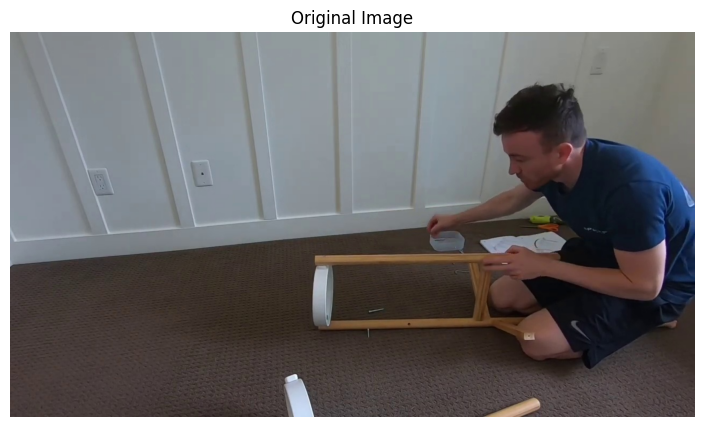

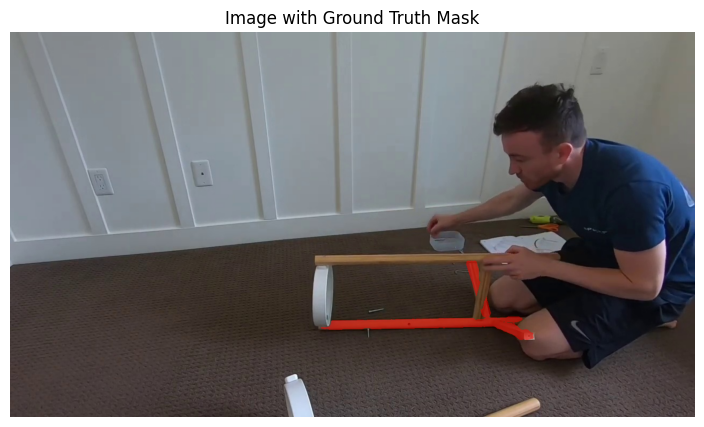

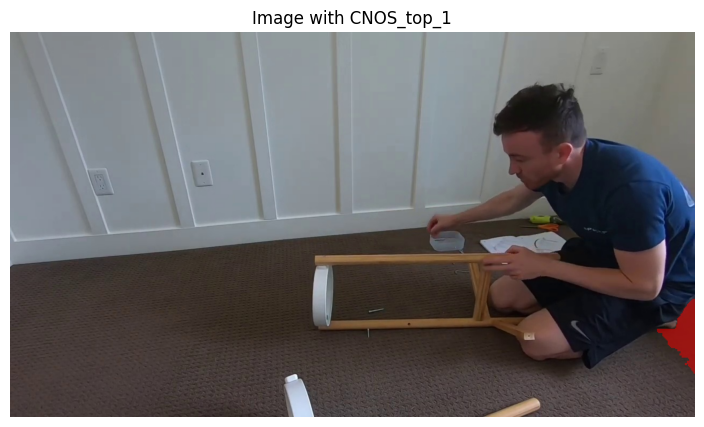

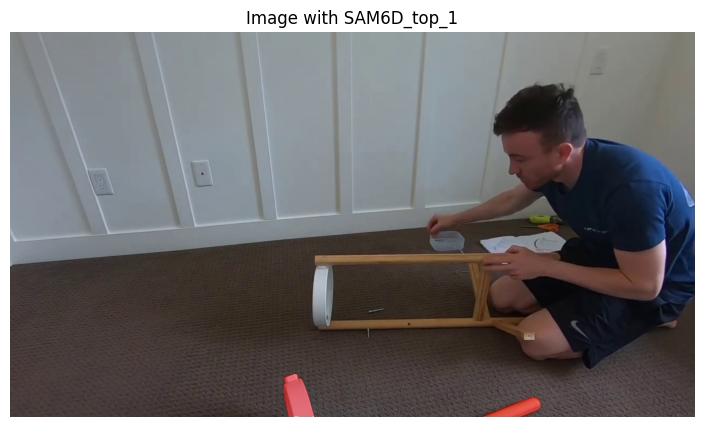

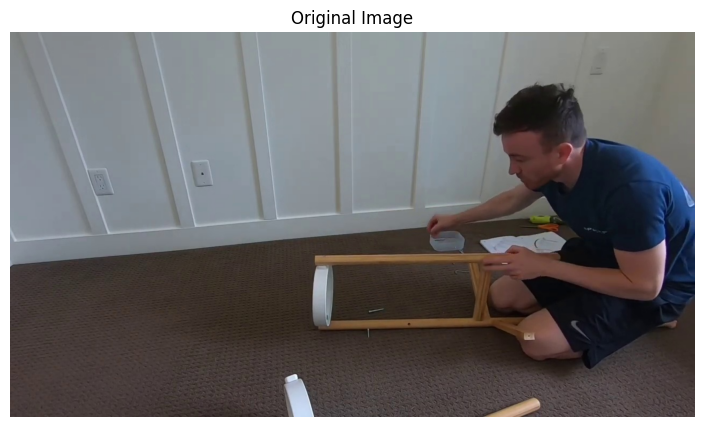

...

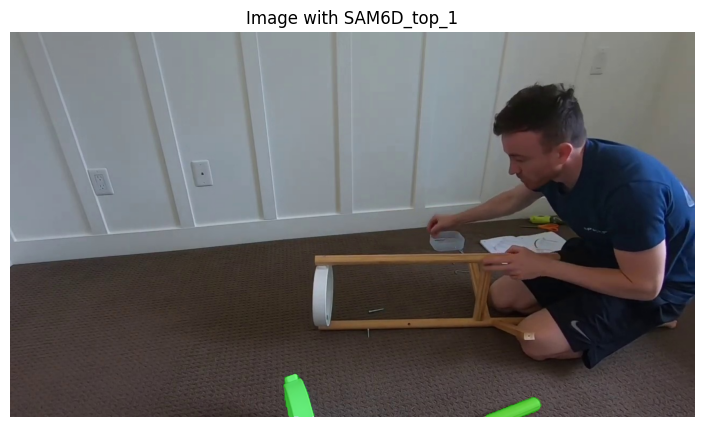

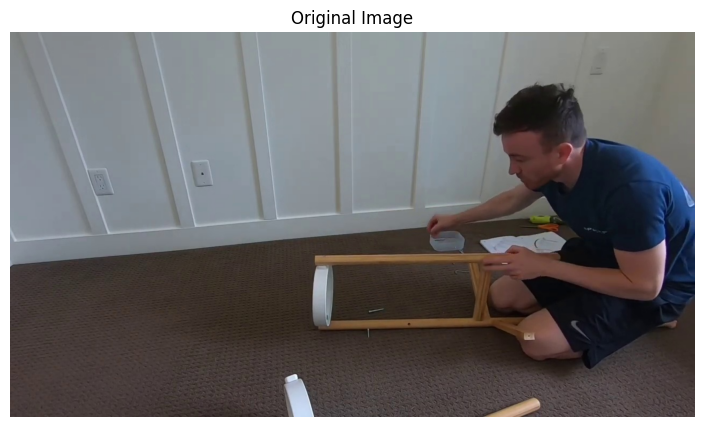

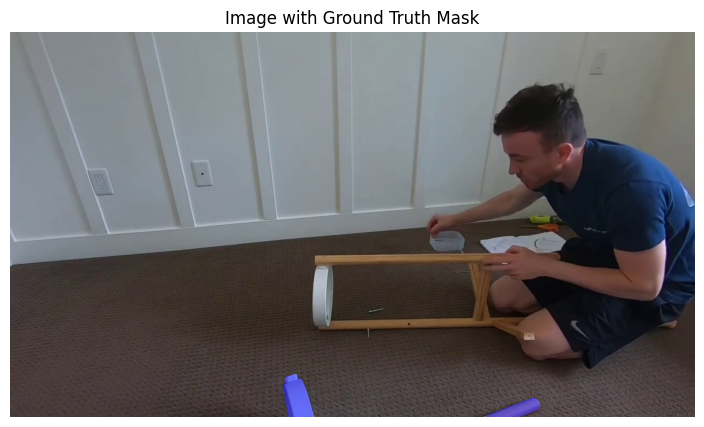

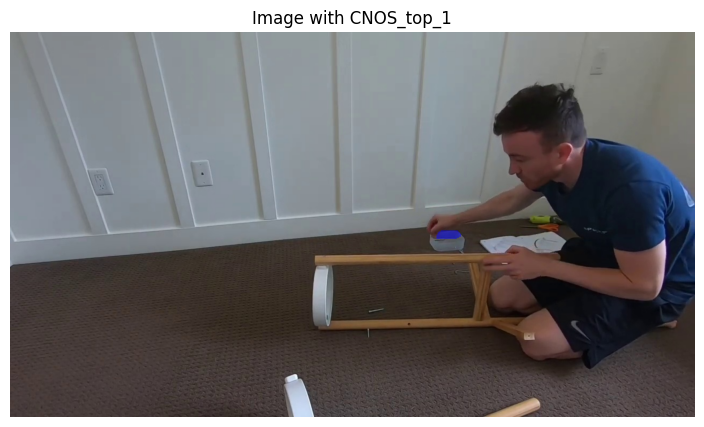

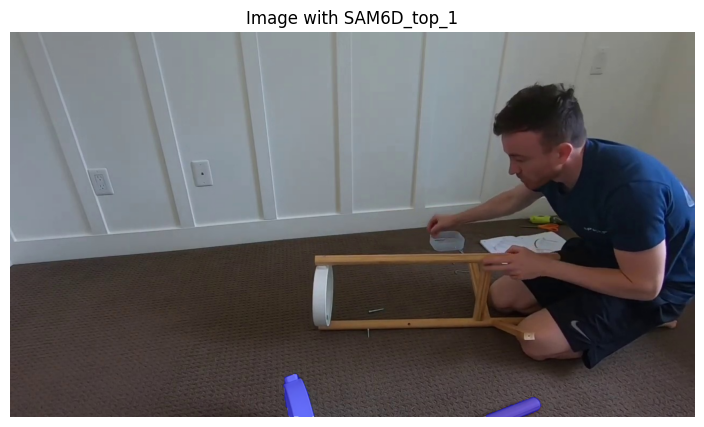

100%|███████████████████████████████████████████████████████████████████| 36/36 [00:03<00:00, 10.87it/s]


In [79]:
targetcategory = "Misc" 
targetname = "satsumas_2" 
targetvideoid = "Mznn3UeAV24" 
frameid = 12604 
# frameid = 12574 
# frameid = 12634 

image_path = prediction_dir + "/{}".format(targetcategory) + "/{}".format(targetname) + "/{}".format(targetvideoid) + "/{}".format(frameid) + "/rgb.jpg" 
image = load_image(image_path) 

for furniture in tqdm(data): 
    category = furniture['category'] 
    if category != targetcategory: 
        continue 
    name = furniture['name'] 
    if name != targetname: 
        continue 
    for step in furniture['steps']:
        for video in step['video']:
            video_id = video['video_id'].split('watch?v=')[-1] 
            if video_id != targetvideoid: 
                continue 
            for frame in video['frames']:
                rgb = None
                frame_id = frame['frame_id']
                if int(frame_id) != frameid: 
                    continue 
                print("found") 
                labelsmask = [] 
                maskcollectcnos = [] 
                maskcollectsam6d = [] 
                for p, part in enumerate(frame['parts']):
                            
                    part_id_str = part.split(',')
                    part_id_str = [int(x) for x in part_id_str]
                    part_id_str = sorted(part_id_str)
                    part_id_str = '_'.join([str(x).zfill(2) for x in part_id_str])


                    mask = frame['mask'][p]
                    if "counts" not in mask: 
                        continue 
                    mask = mask_utils.decode(mask) 
                    labelsmask.append(mask) 
                    
                    prediction_path = f'{prediction_dir}/{category}/{name}/{video_id}/{frame_id}/{part_id_str}/detection.json' 
                    prediction_path_sam6d = f'{prediction_dir_sam6d}/{category}/{name}/{video_id}/{frame_id}/{part_id_str}/sam6d_results/detection_ism.json' 
                    
                    assert os.path.exists(prediction_path) and os.path.exists(prediction_path_sam6d) 
                    
                    paths = [prediction_path, prediction_path_sam6d] 

                    for i, pathfile in enumerate(paths): 
                        with open(pathfile, 'r') as f: 
                            try: 
                                prediction = json.load(f) 
                            except: 
                                print(f'Error: {pathfile}') 
                                continue 
                        scores = [instance['score'] for instance in prediction] 
                        idx = scores.index(max(scores)) 
                        # idx_topd = sorted(range(len(scores)), key=lambda i: scores[i], reverse=True)[:10] 
                        iouscorecollecting = [] 
                        iouscorecollectingfor5 = [] 
                        iouscorecollectingfor10 = [] 
                        # for y, idx in enumerate(idx_topd): 
                            
                        predicted_mask = prediction[idx]['segmentation'] 
                        predicted2_mask = rle_to_mask(predicted_mask) 
                        
                        if i == 0: 
                            maskcollectcnos.append(predicted2_mask) 
                        else: 
                            maskcollectsam6d.append(predicted2_mask) 
                    
                assert len(maskcollectcnos) == len(maskcollectsam6d) 
                assert len(maskcollectcnos) == len(labelsmask) == len(maskcollectsam6d) 
        
                # plt.imshow(mask) 
                for j in range(len(labelsmask)): 
                    visualize_mask(image, labelsmask[j], maskcollectcnos[j], maskcollectsam6d[j], color = j, name = "top_1") 
                    plt.show() 

  0%|                                                                            | 0/36 [00:00<?, ?it/s]

found


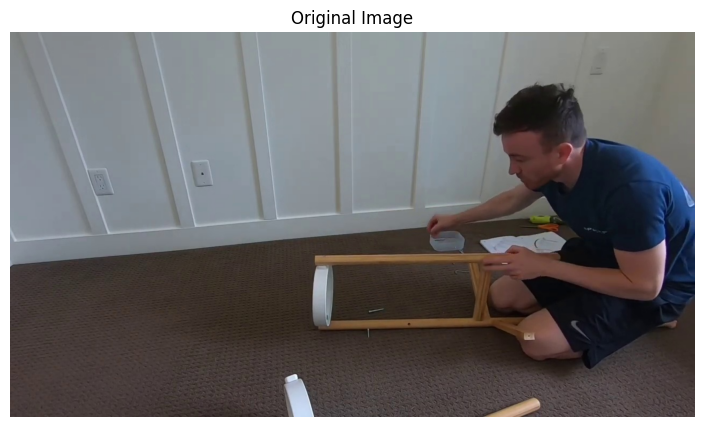

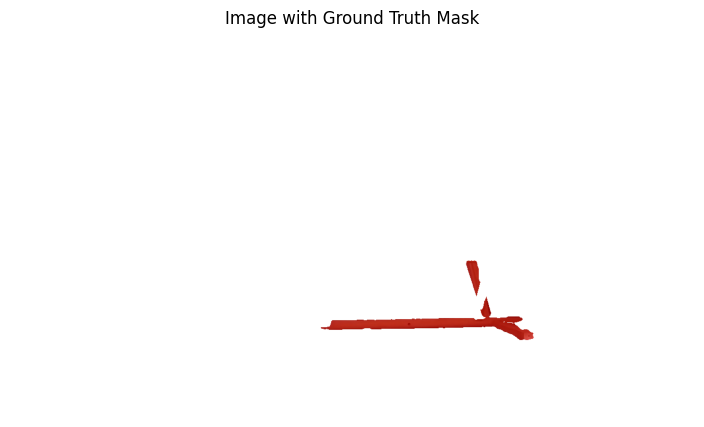

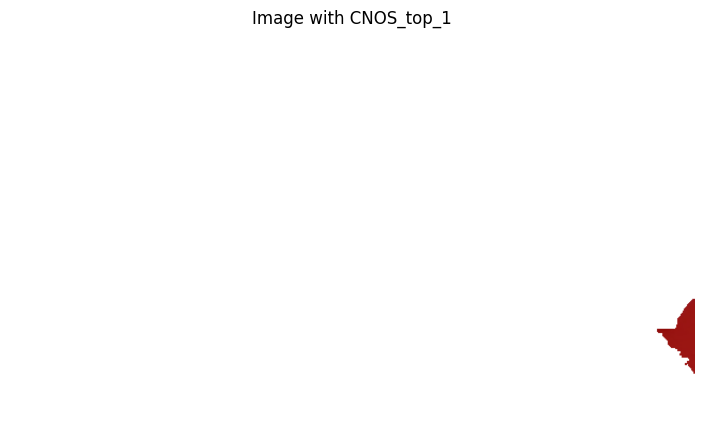

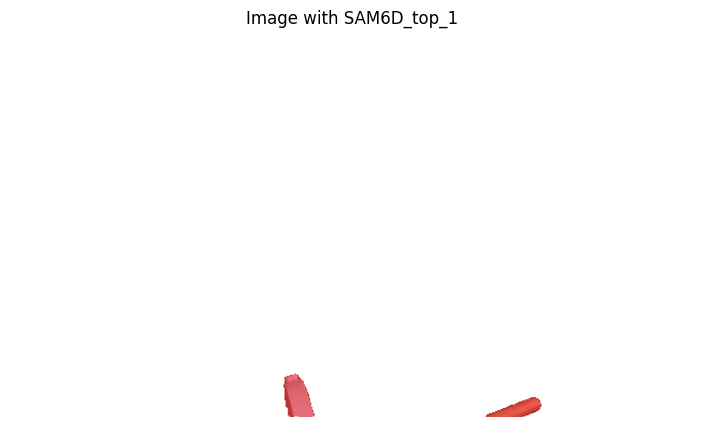

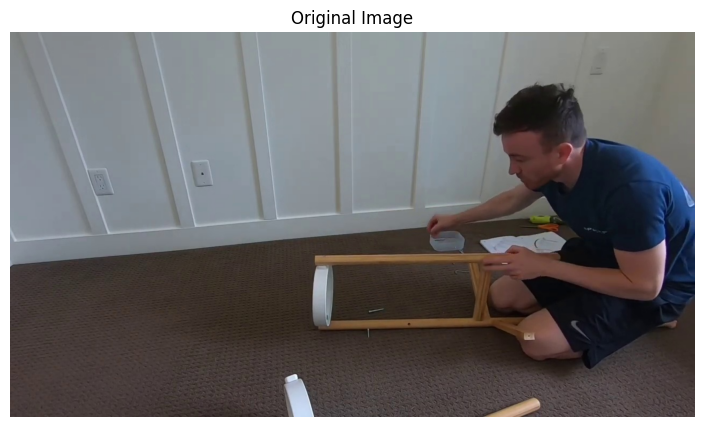

...

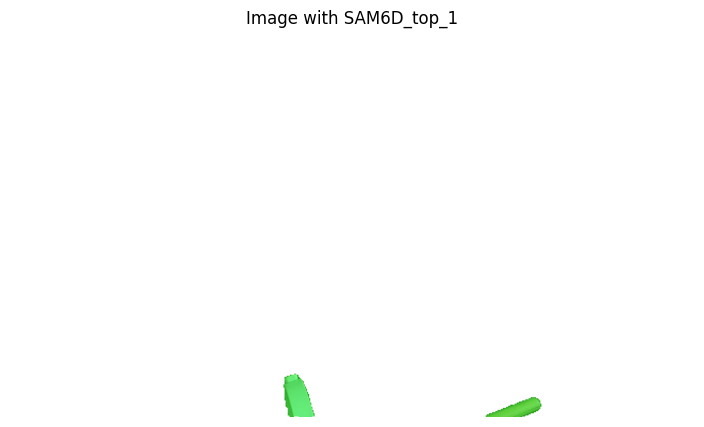

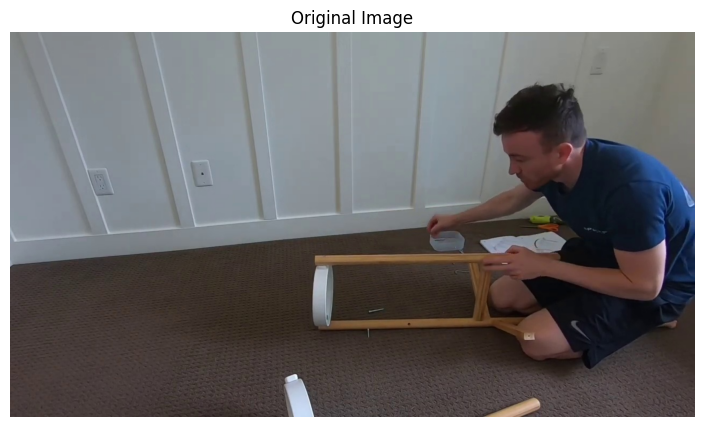

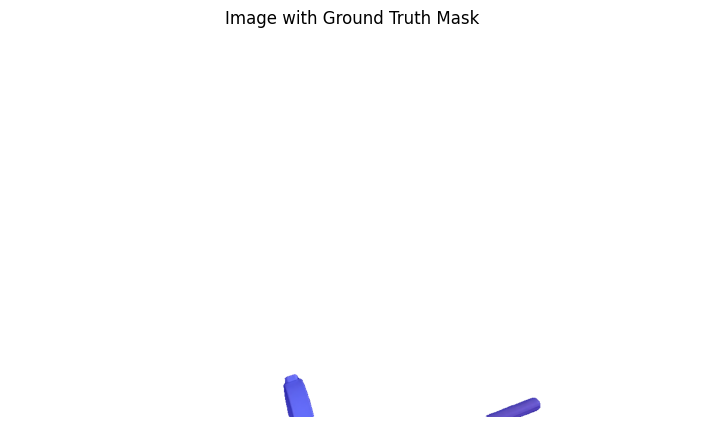

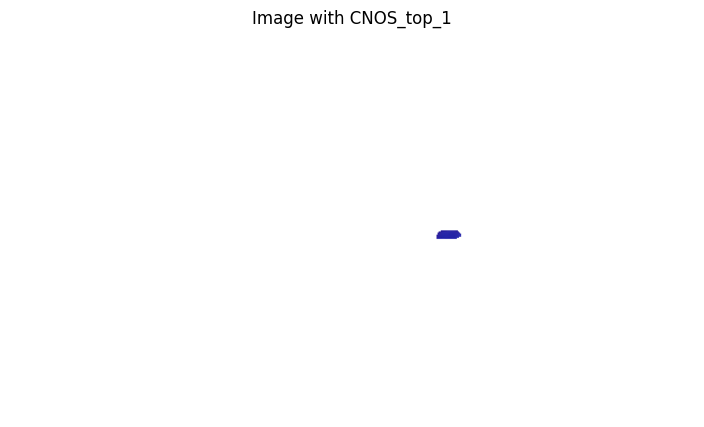

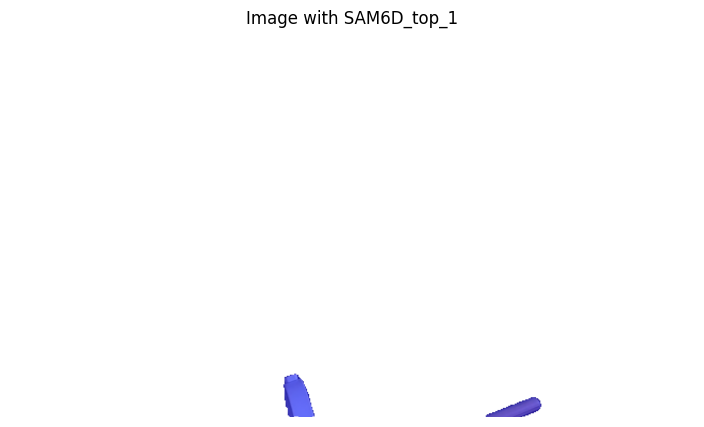

100%|███████████████████████████████████████████████████████████████████| 36/36 [00:03<00:00, 11.72it/s]


In [80]:
targetcategory = "Misc" 
targetname = "satsumas_2" 
targetvideoid = "Mznn3UeAV24" 
frameid = 12604 
# frameid = 12574 
# frameid = 12634 

image_path = prediction_dir + "/{}".format(targetcategory) + "/{}".format(targetname) + "/{}".format(targetvideoid) + "/{}".format(frameid) + "/rgb.jpg" 
image = load_image(image_path) 

for furniture in tqdm(data): 
    category = furniture['category'] 
    if category != targetcategory: 
        continue 
    name = furniture['name'] 
    if name != targetname: 
        continue 
    for step in furniture['steps']:
        for video in step['video']:
            video_id = video['video_id'].split('watch?v=')[-1] 
            if video_id != targetvideoid: 
                continue 
            for frame in video['frames']:
                rgb = None
                frame_id = frame['frame_id']
                if int(frame_id) != frameid: 
                    continue 
                print("found") 
                labelsmask = [] 
                maskcollectcnos = [] 
                maskcollectsam6d = [] 
                for p, part in enumerate(frame['parts']):
                            
                    part_id_str = part.split(',')
                    part_id_str = [int(x) for x in part_id_str]
                    part_id_str = sorted(part_id_str)
                    part_id_str = '_'.join([str(x).zfill(2) for x in part_id_str])


                    mask = frame['mask'][p]
                    if "counts" not in mask: 
                        continue 
                    mask = mask_utils.decode(mask) 
                    labelsmask.append(mask) 
                    
                    prediction_path = f'{prediction_dir}/{category}/{name}/{video_id}/{frame_id}/{part_id_str}/detection.json' 
                    prediction_path_sam6d = f'{prediction_dir_sam6d}/{category}/{name}/{video_id}/{frame_id}/{part_id_str}/sam6d_results/detection_ism.json' 
                    
                    assert os.path.exists(prediction_path) and os.path.exists(prediction_path_sam6d) 
                    
                    paths = [prediction_path, prediction_path_sam6d] 

                    for i, pathfile in enumerate(paths): 
                        with open(pathfile, 'r') as f: 
                            try: 
                                prediction = json.load(f) 
                            except: 
                                print(f'Error: {pathfile}') 
                                continue 
                        scores = [instance['score'] for instance in prediction] 
                        idx = scores.index(max(scores)) 
                        # idx_topd = sorted(range(len(scores)), key=lambda i: scores[i], reverse=True)[:10] 
                        iouscorecollecting = [] 
                        iouscorecollectingfor5 = [] 
                        iouscorecollectingfor10 = [] 
                        # for y, idx in enumerate(idx_topd): 
                            
                        predicted_mask = prediction[idx]['segmentation'] 
                        predicted2_mask = rle_to_mask(predicted_mask) 
                        
                        if i == 0: 
                            maskcollectcnos.append(predicted2_mask) 
                        else: 
                            maskcollectsam6d.append(predicted2_mask) 
                    
                assert len(maskcollectcnos) == len(maskcollectsam6d) 
                assert len(maskcollectcnos) == len(labelsmask) == len(maskcollectsam6d) 
        
                # plt.imshow(mask) 
                for j in range(len(labelsmask)): 
                    visualize_mask_two(image, labelsmask[j], maskcollectcnos[j], maskcollectsam6d[j], color = j, name = "top_1") 
                    plt.show() 

  0%|                                                                            | 0/36 [00:00<?, ?it/s]

found


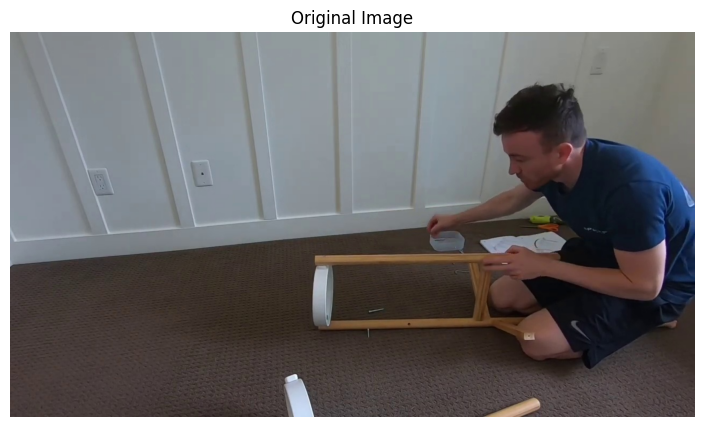

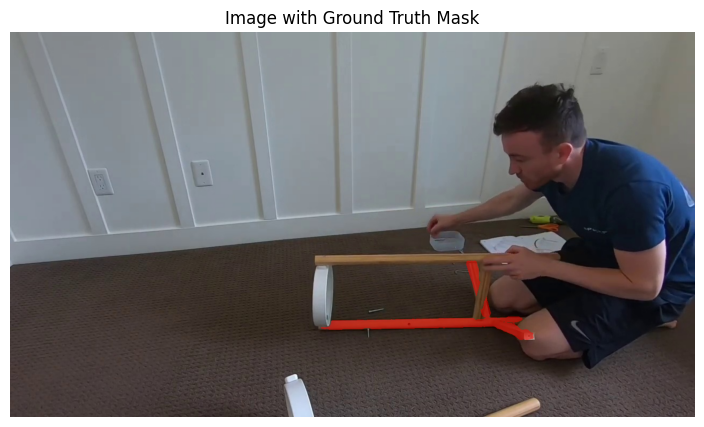

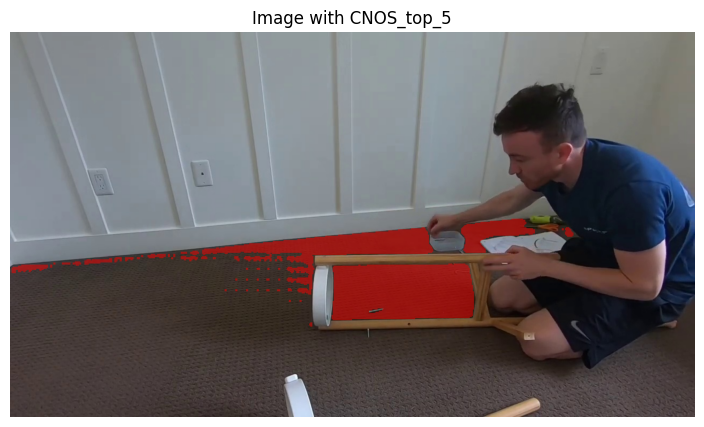

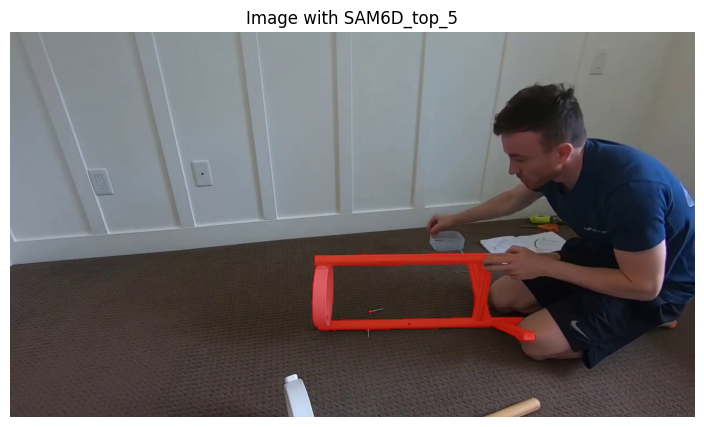

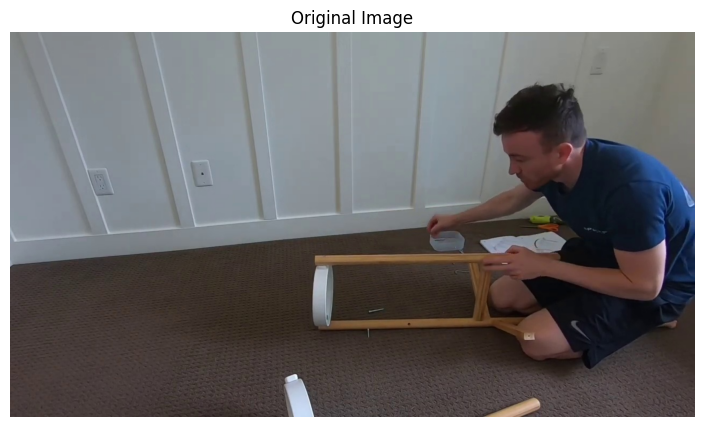

...

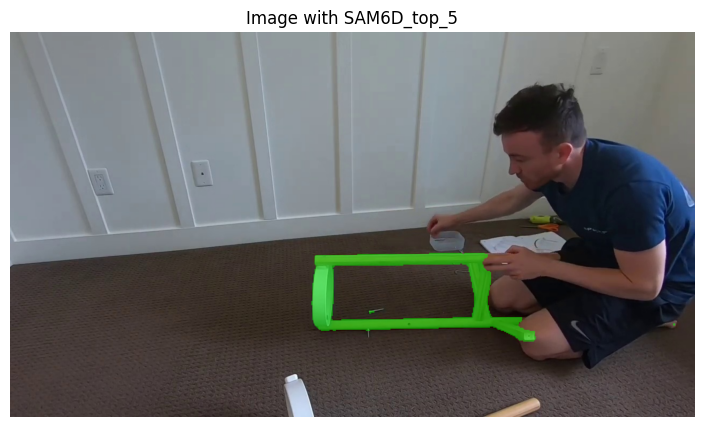

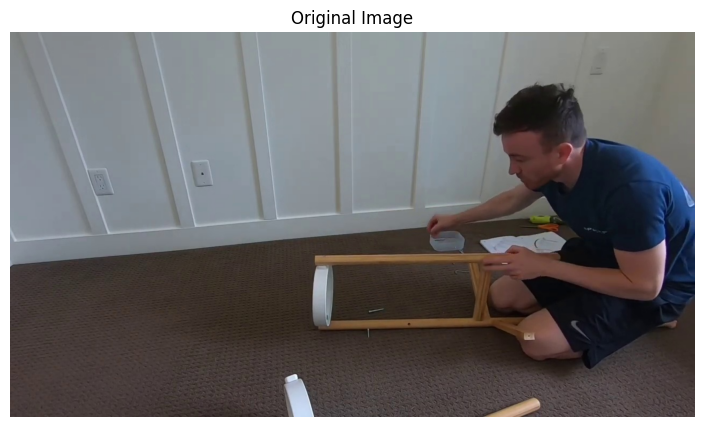

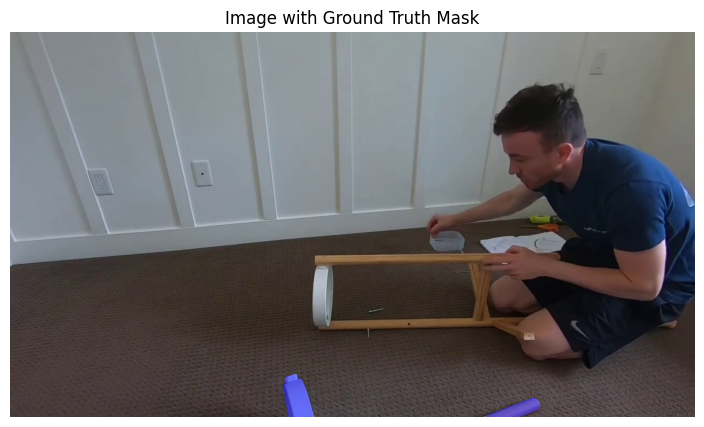

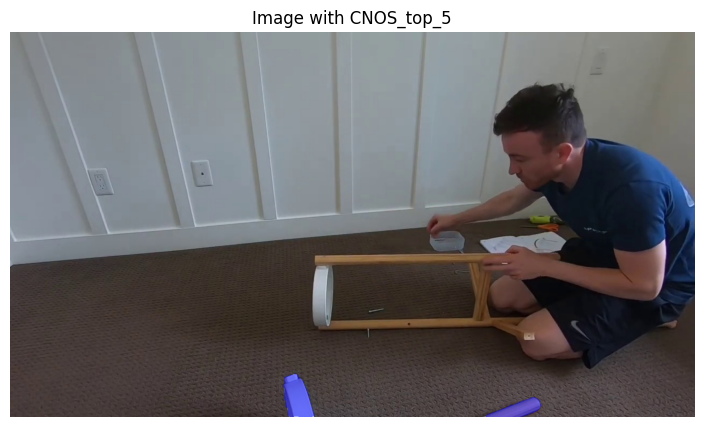

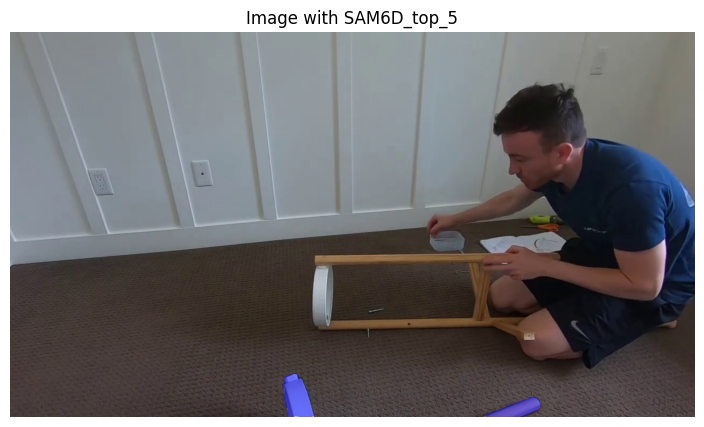

100%|███████████████████████████████████████████████████████████████████| 36/36 [00:03<00:00, 10.44it/s]


In [81]:
targetcategory = "Misc" 
targetname = "satsumas_2" 
targetvideoid = "Mznn3UeAV24" 
frameid = 12604 
# frameid = 12574 
# frameid = 12634 

image_path = prediction_dir + "/{}".format(targetcategory) + "/{}".format(targetname) + "/{}".format(targetvideoid) + "/{}".format(frameid) + "/rgb.jpg" 
image = load_image(image_path) 

for furniture in tqdm(data): 
    category = furniture['category'] 
    if category != targetcategory: 
        continue 
    name = furniture['name'] 
    if name != targetname: 
        continue 
    for step in furniture['steps']:
        for video in step['video']:
            video_id = video['video_id'].split('watch?v=')[-1] 
            if video_id != targetvideoid: 
                continue 
            for frame in video['frames']:
                rgb = None
                frame_id = frame['frame_id']
                if int(frame_id) != frameid: 
                    continue 
                print("found") 
                labelsmask = [] 
                maskcollectcnos = [] 
                maskcollectsam6d = [] 
                for p, part in enumerate(frame['parts']):
                            
                    part_id_str = part.split(',')
                    part_id_str = [int(x) for x in part_id_str]
                    part_id_str = sorted(part_id_str)
                    part_id_str = '_'.join([str(x).zfill(2) for x in part_id_str])


                    mask = frame['mask'][p]
                    if "counts" not in mask: 
                        continue 
                    mask = mask_utils.decode(mask) 
                    labelsmask.append(mask) 
                    
                    prediction_path = f'{prediction_dir}/{category}/{name}/{video_id}/{frame_id}/{part_id_str}/detection.json' 
                    prediction_path_sam6d = f'{prediction_dir_sam6d}/{category}/{name}/{video_id}/{frame_id}/{part_id_str}/sam6d_results/detection_ism.json' 
                    
                    assert os.path.exists(prediction_path) and os.path.exists(prediction_path_sam6d) 
                    
                    paths = [prediction_path, prediction_path_sam6d] 

                    for i, pathfile in enumerate(paths): 
                        with open(pathfile, 'r') as f: 
                            try: 
                                prediction = json.load(f) 
                            except: 
                                print(f'Error: {pathfile}') 
                                continue 
                        scores = [instance['score'] for instance in prediction] 
                        # idx = scores.index(max(scores)) 
                        idx_topd = sorted(range(len(scores)), key=lambda i: scores[i], reverse=True)[:10] 
                        iouscorecollecting = [] 
                        iouscorecollectingfor5 = [] 
                        iouscorecollectingfor10 = [] 
                        maskcollection = [] 
                        for y, idx in enumerate(idx_topd): 
                            
                            predicted_mask = prediction[idx]['segmentation'] 
                            predicted2_mask = rle_to_mask(predicted_mask) 
                            maskcollection.append(predicted2_mask) 
                            
                            metriciou_score = iou(mask, predicted2_mask) 
                            # print("iou score {}".format(metriciou_score)) 
                            if y < 1: 
                                iouscorecollecting.append(metriciou_score) 
                                iouscorecollectingfor5.append(metriciou_score) 
                                iouscorecollectingfor10.append(metriciou_score) 
                            
                            elif y < 5: 
                                iouscorecollectingfor5.append(metriciou_score) 
                                iouscorecollectingfor10.append(metriciou_score) 
                                
                            else: 
                                iouscorecollectingfor10.append(metriciou_score) 
                        selecti = np.argmax(iouscorecollectingfor5) 
                        # selecti = np.argmax(iouscorecollectingfor10) 
                        
                        if i == 0: 
                            maskcollectcnos.append(maskcollection[selecti]) 
                        else: 
                            maskcollectsam6d.append(maskcollection[selecti]) 
                    
                assert len(maskcollectcnos) == len(maskcollectsam6d) 
                assert len(maskcollectcnos) == len(labelsmask) == len(maskcollectsam6d) 
        
                # plt.imshow(mask) 
                for j in range(len(labelsmask)): 
                    visualize_mask(image, labelsmask[j], maskcollectcnos[j], maskcollectsam6d[j], color = j, name = "top_5") 
                    plt.show() 

  0%|                                                    | 0/36 [00:00<?, ?it/s]

found


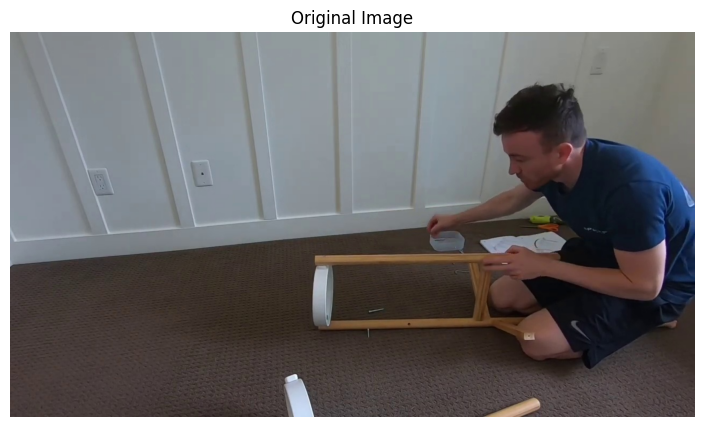

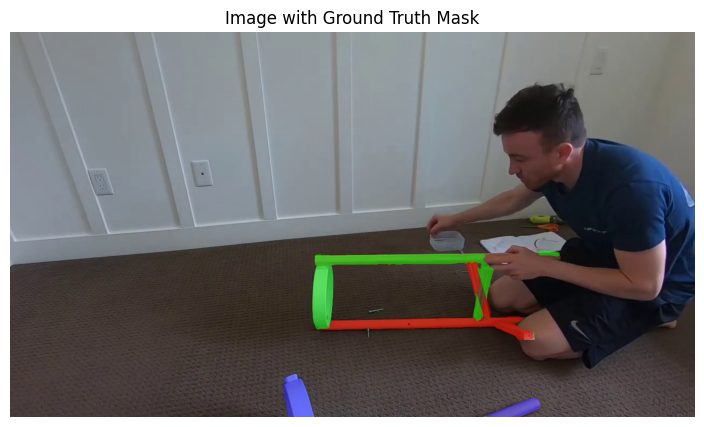

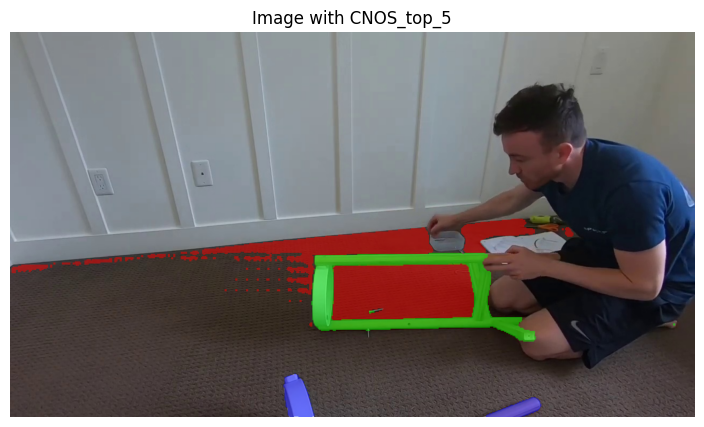

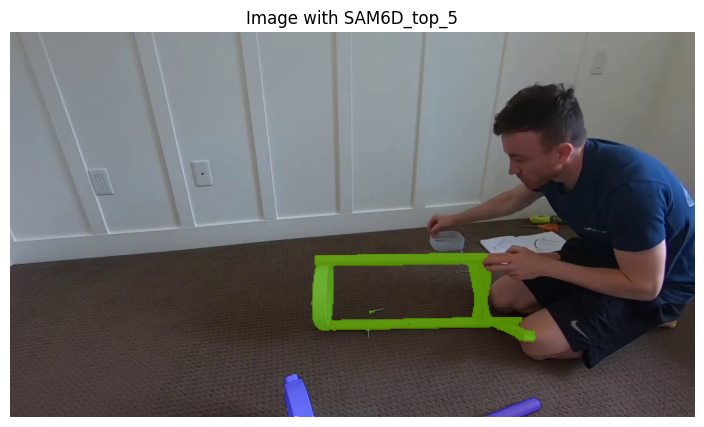

100%|███████████████████████████████████████████| 36/36 [00:02<00:00, 15.33it/s]


In [19]:
import numpy as np 

targetcategory = "Misc" 
targetname = "satsumas_2" 
targetvideoid = "Mznn3UeAV24" 
frameid = 12604 
# frameid = 12574 
# frameid = 12634 

image_path = prediction_dir + "/{}".format(targetcategory) + "/{}".format(targetname) + "/{}".format(targetvideoid) + "/{}".format(frameid) + "/rgb.jpg" 
image = load_image(image_path) 

for furniture in tqdm(data): 
    category = furniture['category'] 
    if category != targetcategory: 
        continue 
    name = furniture['name'] 
    if name != targetname: 
        continue 
    for step in furniture['steps']:
        for video in step['video']:
            video_id = video['video_id'].split('watch?v=')[-1] 
            if video_id != targetvideoid: 
                continue 
            for frame in video['frames']:
                rgb = None
                frame_id = frame['frame_id']
                if int(frame_id) != frameid: 
                    continue 
                print("found") 
                labelsmask = [] 
                maskcollectcnos = [] 
                maskcollectsam6d = [] 
                for p, part in enumerate(frame['parts']):
                            
                    part_id_str = part.split(',')
                    part_id_str = [int(x) for x in part_id_str]
                    part_id_str = sorted(part_id_str)
                    part_id_str = '_'.join([str(x).zfill(2) for x in part_id_str])


                    mask = frame['mask'][p]
                    if "counts" not in mask: 
                        continue 
                    mask = mask_utils.decode(mask) 
                    labelsmask.append(mask) 
                    
                    prediction_path = f'{prediction_dir}/{category}/{name}/{video_id}/{frame_id}/{part_id_str}/detection.json' 
                    prediction_path_sam6d = f'{prediction_dir_sam6d}/{category}/{name}/{video_id}/{frame_id}/{part_id_str}/sam6d_results/detection_ism.json' 
                    
                    assert os.path.exists(prediction_path) and os.path.exists(prediction_path_sam6d) 
                    
                    paths = [prediction_path, prediction_path_sam6d] 

                    for i, pathfile in enumerate(paths): 
                        with open(pathfile, 'r') as f: 
                            try: 
                                prediction = json.load(f) 
                            except: 
                                print(f'Error: {pathfile}') 
                                continue 
                        scores = [instance['score'] for instance in prediction] 
                        # idx = scores.index(max(scores)) 
                        idx_topd = sorted(range(len(scores)), key=lambda i: scores[i], reverse=True)[:10] 
                        iouscorecollecting = [] 
                        iouscorecollectingfor5 = [] 
                        iouscorecollectingfor10 = [] 
                        maskcollection = [] 
                        for y, idx in enumerate(idx_topd): 
                            
                            predicted_mask = prediction[idx]['segmentation'] 
                            predicted2_mask = rle_to_mask(predicted_mask) 
                            maskcollection.append(predicted2_mask) 
                            
                            metriciou_score = iou(mask, predicted2_mask) 
                            # print("iou score {}".format(metriciou_score)) 
                            if y < 1: 
                                iouscorecollecting.append(metriciou_score) 
                                iouscorecollectingfor5.append(metriciou_score) 
                                iouscorecollectingfor10.append(metriciou_score) 
                            
                            elif y < 5: 
                                iouscorecollectingfor5.append(metriciou_score) 
                                iouscorecollectingfor10.append(metriciou_score) 
                                
                            else: 
                                iouscorecollectingfor10.append(metriciou_score) 
                        selecti = np.argmax(iouscorecollectingfor5) 
                        # selecti = np.argmax(iouscorecollectingfor10) 
                        
                        if i == 0: 
                            maskcollectcnos.append(maskcollection[selecti]) 
                        else: 
                            maskcollectsam6d.append(maskcollection[selecti]) 
                    
                assert len(maskcollectcnos) == len(maskcollectsam6d) 
                assert len(maskcollectcnos) == len(labelsmask) == len(maskcollectsam6d) 
        
                # plt.imshow(mask) 
                # for j in range(len(labelsmask)): 
                    # visualize_mask(image, labelsmask[j], maskcollectcnos[j], maskcollectsam6d[j], color = j, name = "top_5") 
                visualize_mask_three(image, labelsmask, maskcollectcnos, maskcollectsam6d, name = "top_5") 
                plt.show() 

  0%|                                                                            | 0/36 [00:00<?, ?it/s]

found


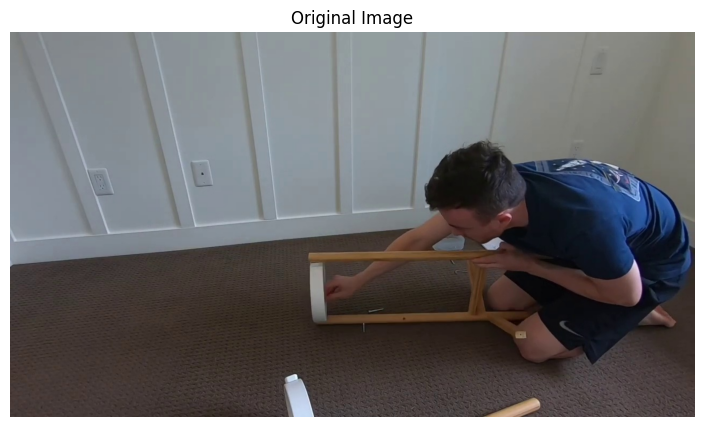

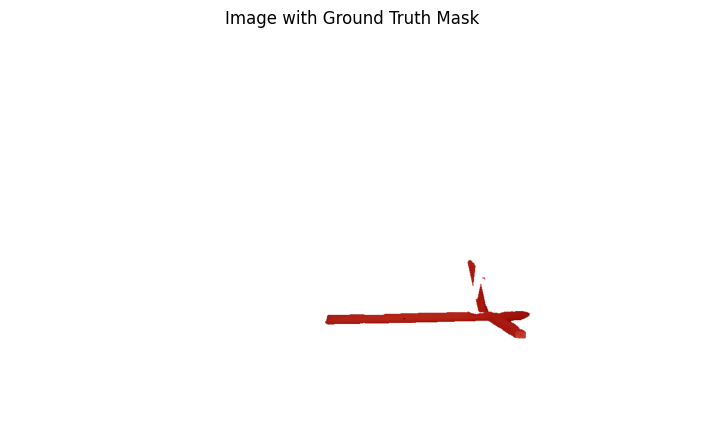

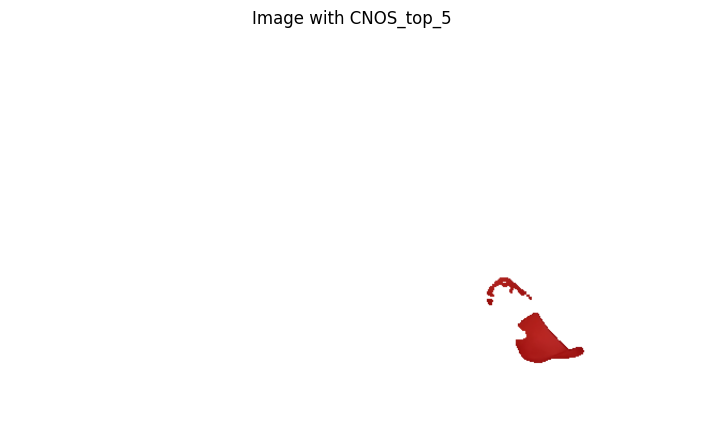

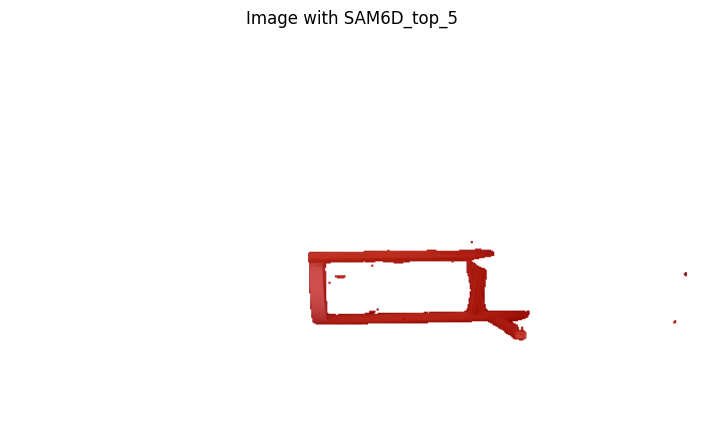

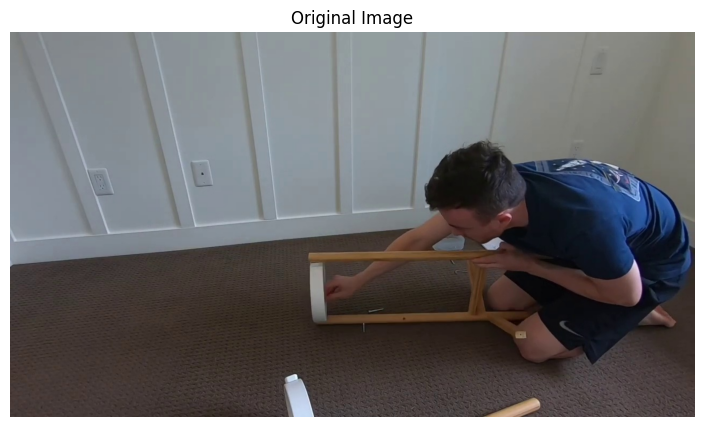

...

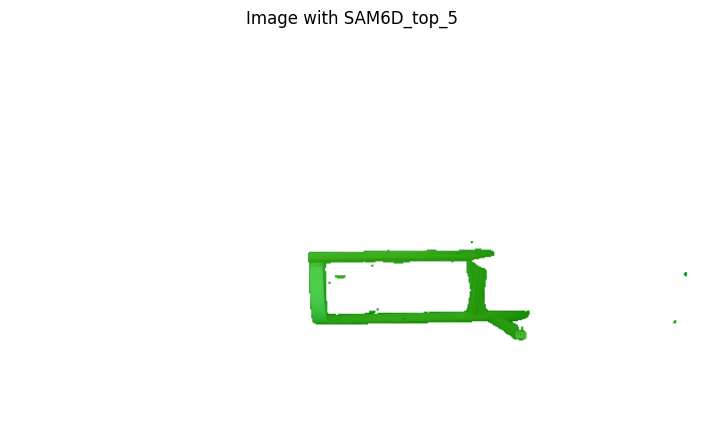

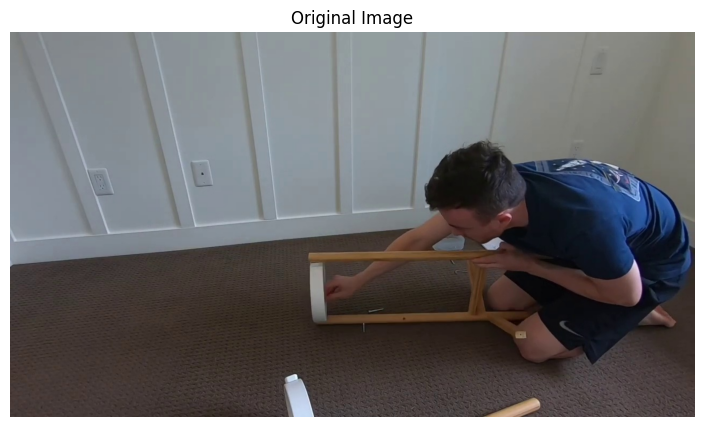

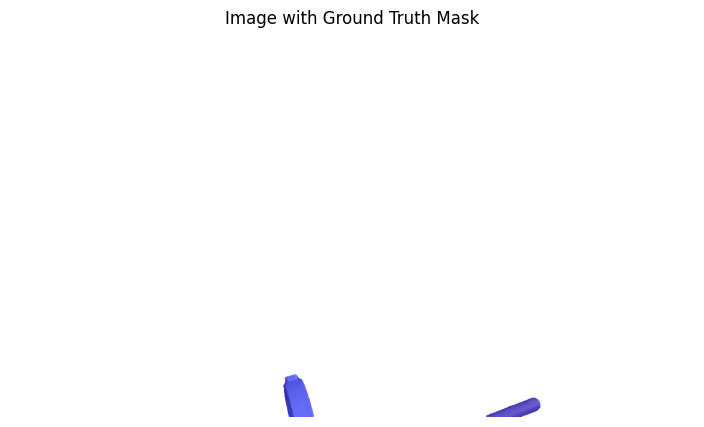

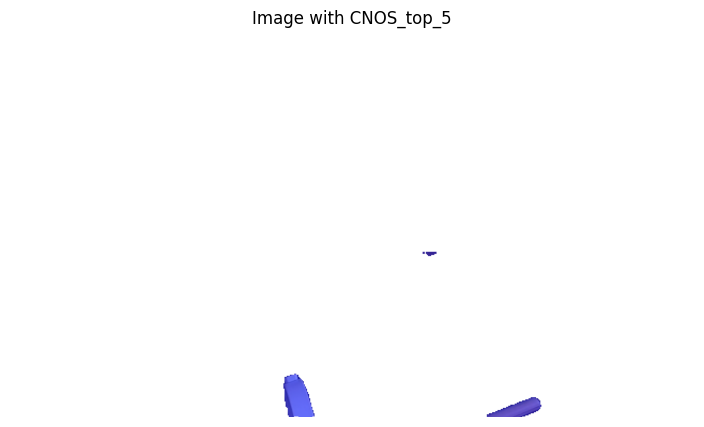

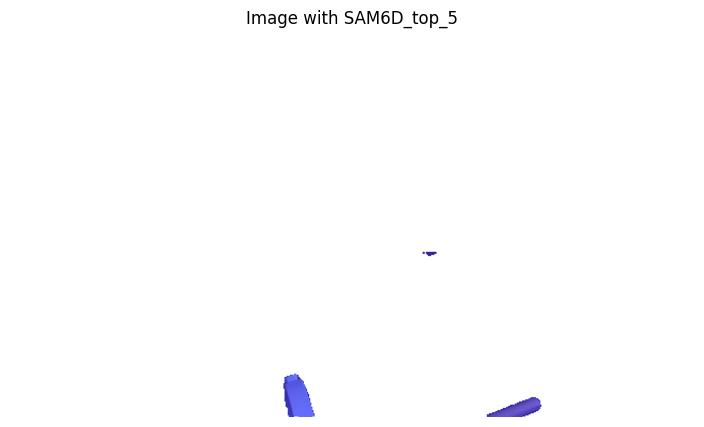

100%|███████████████████████████████████████████████████████████████████| 36/36 [00:03<00:00, 10.28it/s]


In [82]:
targetcategory = "Misc" 
targetname = "satsumas_2" 
targetvideoid = "Mznn3UeAV24" 
# frameid = 12604 
# frameid = 12574 
frameid = 12634 

image_path = prediction_dir + "/{}".format(targetcategory) + "/{}".format(targetname) + "/{}".format(targetvideoid) + "/{}".format(frameid) + "/rgb.jpg" 
image = load_image(image_path) 

for furniture in tqdm(data): 
    category = furniture['category'] 
    if category != targetcategory: 
        continue 
    name = furniture['name'] 
    if name != targetname: 
        continue 
    for step in furniture['steps']:
        for video in step['video']:
            video_id = video['video_id'].split('watch?v=')[-1] 
            if video_id != targetvideoid: 
                continue 
            for frame in video['frames']:
                rgb = None
                frame_id = frame['frame_id']
                if int(frame_id) != frameid: 
                    continue 
                print("found") 
                labelsmask = [] 
                maskcollectcnos = [] 
                maskcollectsam6d = [] 
                for p, part in enumerate(frame['parts']):
                            
                    part_id_str = part.split(',')
                    part_id_str = [int(x) for x in part_id_str]
                    part_id_str = sorted(part_id_str)
                    part_id_str = '_'.join([str(x).zfill(2) for x in part_id_str])


                    mask = frame['mask'][p]
                    if "counts" not in mask: 
                        continue 
                    mask = mask_utils.decode(mask) 
                    labelsmask.append(mask) 
                    
                    prediction_path = f'{prediction_dir}/{category}/{name}/{video_id}/{frame_id}/{part_id_str}/detection.json' 
                    prediction_path_sam6d = f'{prediction_dir_sam6d}/{category}/{name}/{video_id}/{frame_id}/{part_id_str}/sam6d_results/detection_ism.json' 
                    
                    assert os.path.exists(prediction_path) and os.path.exists(prediction_path_sam6d) 
                    
                    paths = [prediction_path, prediction_path_sam6d] 

                    for i, pathfile in enumerate(paths): 
                        with open(pathfile, 'r') as f: 
                            try: 
                                prediction = json.load(f) 
                            except: 
                                print(f'Error: {pathfile}') 
                                continue 
                        scores = [instance['score'] for instance in prediction] 
                        # idx = scores.index(max(scores)) 
                        idx_topd = sorted(range(len(scores)), key=lambda i: scores[i], reverse=True)[:10] 
                        iouscorecollecting = [] 
                        iouscorecollectingfor5 = [] 
                        iouscorecollectingfor10 = [] 
                        maskcollection = [] 
                        for y, idx in enumerate(idx_topd): 
                            
                            predicted_mask = prediction[idx]['segmentation'] 
                            predicted2_mask = rle_to_mask(predicted_mask) 
                            maskcollection.append(predicted2_mask) 
                            
                            metriciou_score = iou(mask, predicted2_mask) 
                            # print("iou score {}".format(metriciou_score)) 
                            if y < 1: 
                                iouscorecollecting.append(metriciou_score) 
                                iouscorecollectingfor5.append(metriciou_score) 
                                iouscorecollectingfor10.append(metriciou_score) 
                            
                            elif y < 5: 
                                iouscorecollectingfor5.append(metriciou_score) 
                                iouscorecollectingfor10.append(metriciou_score) 
                                
                            else: 
                                iouscorecollectingfor10.append(metriciou_score) 
                        selecti = np.argmax(iouscorecollectingfor5) 
                        # selecti = np.argmax(iouscorecollectingfor10) 
                        
                        if i == 0: 
                            maskcollectcnos.append(maskcollection[selecti]) 
                        else: 
                            maskcollectsam6d.append(maskcollection[selecti]) 
                    
                assert len(maskcollectcnos) == len(maskcollectsam6d) 
                assert len(maskcollectcnos) == len(labelsmask) == len(maskcollectsam6d) 
        
                # plt.imshow(mask) 
                for j in range(len(labelsmask)): 
                    visualize_mask_two(image, labelsmask[j], maskcollectcnos[j], maskcollectsam6d[j], color = j, name = "top_5") 
                    plt.show() 

In [7]:
from PIL import Image 
import numpy as np 

def load_image(path):
    """Load an image from a file path."""
    return np.array(Image.open(path))

def visualize_mask_old(image, mask1, mask2, mask3, color=(255, 0, 0), alpha=0.5): 
    """Overlay a one-hot mask on the image.
    
    Args:
    image: numpy array of the image.
    mask: one-hot encoded 2D numpy array (same dimensions as image) where 1s will be highlighted.
    color: tuple indicating the color of the overlay (R, G, B).
    alpha: transparency level of the overlay.
    """
    # Create an RGB version of the mask
    colored_mask = np.zeros((*mask1.shape, 3), dtype=np.uint8) 
    # colored_mask[mask == 1] = color 
    colored_mask[mask1 == 1] = color 

    # Combine the images
    # overlayed_image = image 

    # Plotting
    plt.figure(figsize=(20, 10)) 

    plt.title('Original Image')
    plt.imshow(image)
    plt.show() 

    overlayed_image = np.zeros_like(image) 
    overlayed_image += 255 
    indices = np.where(mask1 == 1) 
    overlayed_image[indices] = image[indices] 
    plt.title('Image with Ground Truth Mask') 
    plt.imshow(overlayed_image)
    plt.show() 
    
    overlayed_image = np.zeros_like(image) 
    overlayed_image += 255 
    indices = np.where(mask2 == 1) 
    overlayed_image[indices] = image[indices] 
    # plt.subplot(1, 4, 3) 
    plt.title("Image with CNOS") 
    plt.imshow(overlayed_image)
    plt.show() 
    
    overlayed_image = np.zeros_like(image) 
    overlayed_image += 255 
    indices = np.where(mask3 == 1) 
    overlayed_image[indices] = image[indices] 
    # plt.subplot(1, 4, 4) 
    plt.title("Image with SAM-6D") 
    plt.imshow(overlayed_image)
    plt.show() 

image_path = prediction_dir + "/{}".format(targetcategory) + "/{}".format(targetname) + "/{}".format(targetvideoid) + "/{}".format(frameid) + "/rgb.jpg" 
image = load_image(image_path) 

In [42]:
def visualize_mask(image, mask1, mask2, mask3, color=(255, 0, 0), alpha=0.5): 
    """Overlay a one-hot mask on the image.
    
    Args:
    image: numpy array of the image.
    mask: one-hot encoded 2D numpy array (same dimensions as image) where 1s will be highlighted.
    color: tuple indicating the color of the overlay (R, G, B).
    alpha: transparency level of the overlay.
    """
    # Create an RGB version of the mask
    # colored_mask = np.zeros((*mask1.shape, 3), dtype=np.uint8) 
    # colored_mask[mask1 == 1] = color 

    # Plotting
    plt.figure(figsize=(10, 5)) 

    plt.title('Original Image')
    plt.imshow(image)
    plt.show() 
    plt.axis("off") 

    # Combine the images 
    plt.figure(figsize=(10, 5)) 
    overlayed_image = image.copy()
    indices = np.where(mask1 == 1) 
    overlayed_image[indices] = overlayed_image[indices] * (1 - alpha) + np.array((255, 0, 0)) * alpha 
    plt.title("Image with Ground Truth Mask") 
    plt.imshow(overlayed_image)
    plt.show() 
    plt.axis("off") 
    
    # Combine the images 
    plt.figure(figsize=(10, 5)) 
    overlayed_image = image.copy()
    indices = np.where(mask2 == 1) 
    overlayed_image[indices] = overlayed_image[indices] * (1 - alpha) + np.array((0, 255, 0)) * alpha
    plt.title("Image with CNOS") 
    plt.imshow(overlayed_image)
    plt.show() 
    plt.axis("off") 
    
    # Combine the images 
    plt.figure(figsize=(10, 5)) 
    overlayed_image = image.copy()
    indices = np.where(mask3 == 1) 
    overlayed_image[indices] = overlayed_image[indices] * (1 - alpha) + np.array((0, 255, 0)) * alpha
    plt.title("Image with CNOS") 
    plt.imshow(overlayed_image)
    plt.show() 
    plt.axis("off") 

# Example usage
# image_path = 'path_to_your_image.png'  # Change to your image path
# mask_path = 'path_to_your_mask.npy'    # Change to your mask file path 

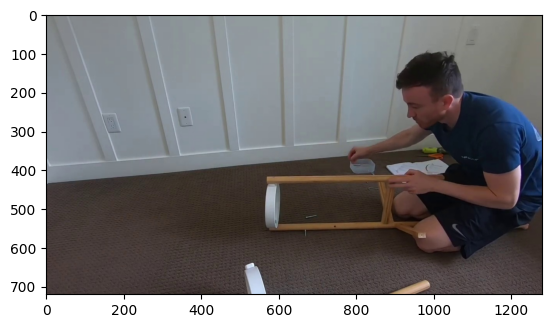

In [11]:
plt.imshow(image) 

In [31]:
visualize_mask(image, mask) 

TypeError: visualize_mask() missing 2 required positional arguments: 'mask2' and 'mask3'